In [55]:
# Import required packages
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import rasterio as rio
import pandas as pd
import earthpy.plot as ep

# Set font sizes for plots
plt.rc('figure', titlesize=24)
plt.rc('axes', titlesize=16)

# Set area of interest and define paths
combined_path = '..\\data\\combined\\'
koumassi_aoi = "koumassi_focus_ps"
koumassi_band_path = '..\\data\\'+koumassi_aoi+"\\"
koumassi_raster_outputs_path = os.path.join(koumassi_band_path, "final_outputs\\raster_files\\")
koumassi_raster_explorations_path = os.path.join(koumassi_band_path, "explorations_outputs\\raster_files\\")
koumassi_threshold_outputs_path = os.path.join(koumassi_band_path, "final_outputs\\threshold\\")
koumassi_svm_outputs_path = os.path.join(koumassi_band_path, "final_outputs\\svm\\")
koumassi_kmeans_outputs_path = os.path.join(koumassi_band_path, "final_outputs\\kmeans\\")
koumassi_kmeans_explorations_path = os.path.join(koumassi_band_path, "explorations_outputs\\kmeans\\")


southeast_aoi = "southeast_ps"
southeast_band_path = '..\\data\\'+southeast_aoi+"\\"
southeast_raster_outputs_path = os.path.join(southeast_band_path, "final_outputs\\raster_files\\")
southeast_raster_explorations_path = os.path.join(southeast_band_path, "explorations_outputs\\raster_files\\")
southeast_threshold_outputs_path = os.path.join(southeast_band_path, "final_outputs\\threshold\\")
southeast_svm_outputs_path = os.path.join(southeast_band_path, "final_outputs\\svm\\")
southeast_kmeans_outputs_path = os.path.join(southeast_band_path, "final_outputs\\kmeans\\")
southeast_kmeans_explorations_path = os.path.join(southeast_band_path, "explorations_outputs\\kmeans\\")

 ## Improving flood detection algorithm using high resolution imagery

Over the past 20 years, floods accounted for 43% of all recorded disasters. In that same time period, more than two billion people were affected by flooding events, including over 140,000 deaths, and economic losses amounting to $656M USD. Flooding events are expected to increase in frequency and extent due to the impacts of climate change, including heavy precipitation events, rapid spring snowmelt, and dramatic storm surge. In urban areas, flooding is exacerbated by the presence of impermeable cement surfaces and ineffective drainage systems. In the next 30 years, the urban population is expected to grow by an additional 2.5 billion people, with the majority of growth centered in Africa and Asia.

While it is difficult to predict where the next flooding disaster may strike, preparedness is key to mitigating the extent of the damage. Traditional flood mapping is an extensive and expensive endeavor, involving teams of engineers, modelers, and field personnel working on just one specific location. Due to the resources required to develop these maps, many communities, especially those in low- and middle-income countries, do not have adequate maps or rely on maps which are out of date. This lack of up-to-date information means that residents and businesses located within a potential flood plain may not realize that they are at risk, and are unable to take steps to protect themselves and their property. 

Remote sensing, and specifically the availability of high-resolution satellite imagery, which can provide detailed aerial views of cities, offers a new way to examine floods and define risk. Historical images can be rapidly analyzed to give a sense of frequency and extent of natural disasters such as floods. This information can be used to develop low-cost flood maps which can be used to ensure all residents of the potential flood plain are identified and updated regularly. Additionally, near real-time monitoring of natural disasters is possible as satellites provide regularly updated images on a relatively short time-scale.

The conventional method for analyzing open water on satellite imagery is through using the normalized difference water index (NDWI), a ratio of the near-infrared radiation and visible green light spectral bands. A challenge in assessing open water in an urban environment is that buildings can interfere with the NDWI signal. The modified NDWI (MNDWI) was developed specifically to address this interference, and utilizes short-wave infrared radiation (SWIR) in place of near-infrared radiation. However, high-resolution imagery from satellites such as DigitalGlobe’s WorldView-2 often lack the SWIR band, rendering the MNDWI calculation impossible. Organizations working in identifying urban flooding have sought to identify a variety of image-specific algorithms that utilize combinations of spectral bands and indices have had mixed success. One of the remaining challenges in defining urban flood extent is confusion between cloud and building shadows and flood waters, which look visually similar and can be miscategorized. 

In partnership with Cloud to Street, a company focused on providing flood information to low- and middle-income countries, this research aimed to explore Python-based methods to improve the detection of floods in urban environments, with a specific focus on better differentiating between building shadow and flood water. The study image was a WorldView-2 image from a flooding event in Abidjan, Ivory Coast on June 17th, 2016. Two sub-sections of the city were selected as focus areas. The first, in the Koumassi region of the city represented a highly urban area. The second, in the Southeast section of the city, represented lower lying wetland terrain. Each method was validated using a reference data set. Several methods were explored:

-	Thresholding spectral indices
-	Supervised machine learning
        - Random Forest (RF)
        - Support Vector Machine (SVM)
-	Unsupervised machine learning
        - K-means
        - Gaussian mixture modeling (GMM)

<img src="Study_area.png">

**Figure 1.** Study map including the two areas of interest: Koumassi and Southeast.

## Comparison to Cloud to Street Flood Map

This study utilized an image which had been previously analysed by Cloud to Street. The thresholding approach was meant to be a way to mimic the current algorithm utilized by Cloud to Street. However, it is important to note that this current analysis utilizes pan-sharpened images, while Cloud to Street used multispectral images. Additionally, the thresholding approach in this study added additional spectral indices including the morphological shadow index (MSI) and the morphological building index (MBI). Cloud to Street flood maps and confusion matrices for Koumassi and Southeast are presented in Figure 2 to serve as a sort of baseline for this study. Accuracy scores were 53% (31% for flood only) and for Koumassi and Southeast, respectively. 

<img src="CtS_Koumassi.png">

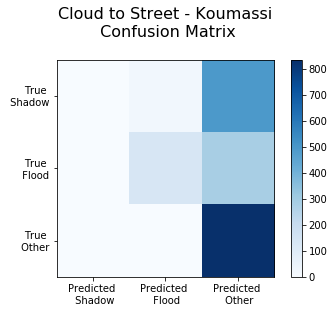

In [62]:
koumassi_confusion_CtS = pd.read_csv(koumassi_threshold_outputs_path+'threshold_confusion_cloudtostreet.csv')
koumassi_confusion_CtS = koumassi_confusion_CtS.drop(koumassi_confusion_threshold.columns[[0]], axis=1)
koumassi_confusion_CtS_plot = koumassi_confusion_CtS.values
koumassi_confusion_CtS_plot=koumassi_confusion_CtS_plot[0:4,0:4]

plt.imshow(koumassi_confusion_CtS_plot,cmap='Blues', interpolation='nearest')
plt.xticks(np.arange(3), ('Predicted \n Shadow','Predicted \n Flood','Predicted \n Other'))
plt.yticks(np.arange(3), ('True \n Shadow','True \n Flood','True \n Other'))
plt.title('Cloud to Street - Koumassi\n Confusion Matrix\n')
plt.colorbar()
plt.grid(False)
plt.show()

<img src="CtS_Southeast.png">

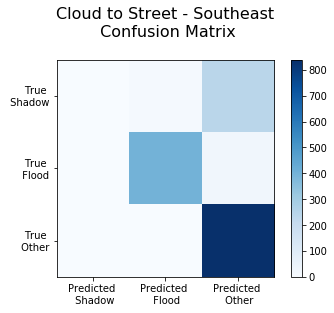

In [64]:
southeast_confusion_CtS = pd.read_csv(southeast_threshold_outputs_path+'threshold_confusion_cloudtostreet.csv')
southeast_confusion_CtS = southeast_confusion_CtS.drop(southeast_confusion_threshold.columns[[0]], axis=1)
southeast_confusion_CtS_plot = southeast_confusion_CtS.values
southeast_confusion_CtS_plot=southeast_confusion_CtS_plot[0:4,0:4]

plt.imshow(southeast_confusion_CtS_plot,cmap='Blues', interpolation='nearest')
plt.xticks(np.arange(3), ('Predicted \n Shadow','Predicted \n Flood','Predicted \n Other'))
plt.yticks(np.arange(3), ('True \n Shadow','True \n Flood','True \n Other'))
plt.title('Cloud to Street - Southeast\n Confusion Matrix\n')
plt.colorbar()
plt.grid(False)
plt.show()

**Figure 2.** Flood maps from Cloud to Street research project for Koumassi and Southeast study areas. Confusion matrices show substantial mix-up between land cover classes for Koumassi, but a better representation for the Southeast. 

## Traditional Thresholding 

The first approach involved thresholding established spectral indices to identify water, building shadow, vegetation and buildings. In addition to the standard indices for water (Normalized Difference Water Index, NDWI) and vegetation (Normalized Difference Vegetation Index, NDVI), two relatively new indices were included. These indices were developed by Huang et al. (2012, 2015) and can be used to identify buildings (Morphological Building Index, MBI) and building shadows (Morphological Shadow Index, MSI). Thresholding is somewhat of a trial and error method and the chosen thresholds were identified after iterative testing. Thresholds are generally image specific, meaning that the process must be done for each image of interest. 

The thresholded maps were relatively noisy, and two methods for reducing the noise were explored. First, the thresholded maps were labeled using scikit-image, transforming each continuous land cover type into an object. Objects less that a certain pixel size could then be removed. The second "de-noising" method involved using a morphological smoothing function  to reduce the number of errant pixels identified as a specific land cover type.Figure YY shows an example of the thresholded MSI shadow mask, and the de-noised versions using both labeling/patch removal and morphological opening.  

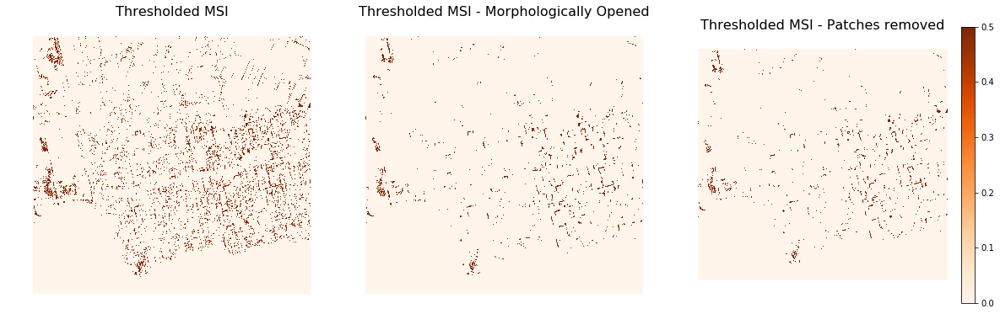

In [21]:
# Import shadow mask files
thresholded_msi_path = os.path.join(koumassi_raster_explorations_path,"threshold_msi.tif")
shadow_mask_path = os.path.join(koumassi_raster_outputs_path,"shadow_mask.tif")
shadow_mask_patches_path = os.path.join(koumassi_raster_explorations_path,"shadow_mask_patches_removed.tif")
with rio.open(thresholded_msi_path) as src:
    threshold_msi = src.read()
with rio.open(shadow_mask_path) as src:
    shadow_mask = src.read()
with rio.open(shadow_mask_patches_path) as src:
    shadow_mask_patches = src.read()
threshold_msi = np.squeeze(threshold_msi)
shadow_mask = np.squeeze(shadow_mask)
shadow_mask_patches = np.squeeze(shadow_mask_patches)
    
# Plot comparison of denoising shadow masks
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20, 10))

msi_plot = ax1.imshow(threshold_msi, cmap = 'Oranges',vmin = 0, vmax = 0.5)
ax1.set(title="Thresholded MSI\n")
ax1.set_axis_off()

morph_plot = ax2.imshow(shadow_mask, cmap = 'Oranges', vmin = 0, vmax = 0.5)
ax2.set(title="Thresholded MSI - Morphologically Opened\n")
ax2.set_axis_off()

patches_plot = ax3.imshow(shadow_mask_patches, cmap = 'Oranges', vmin = 0, vmax = 0.5)
ax3.set(title="Thresholded MSI - Patches removed\n")
ax3.set_axis_off()

fig.colorbar(msi_plot, fraction=.05)
plt.show()

**Figure 3.** Comparison of different methods for denoising shadow mask. Methods appear to produce similar results. For final workflow, morphological opening was used. A similar method was applied to all land cover masks.

Once individual thresholded masks were created and denoised, the four masks were combined into a single image. The combinations was done using the following hierarchy: shadow mask, flood mask, vegetation mask, and then building masks. One exception is that where building and flood overlapped, buildings took priority to reduce the overprediction of flood due to confusion with buildings. The final threshold maps had accuracy scores of 59.5% and 78.5% for Koumassi and Southeast, respectively. Based on the resulting maps and accuracy scores, it appears that the thresholding method is most appropriate for less urban environments due to the miscategorization of building shadow. 

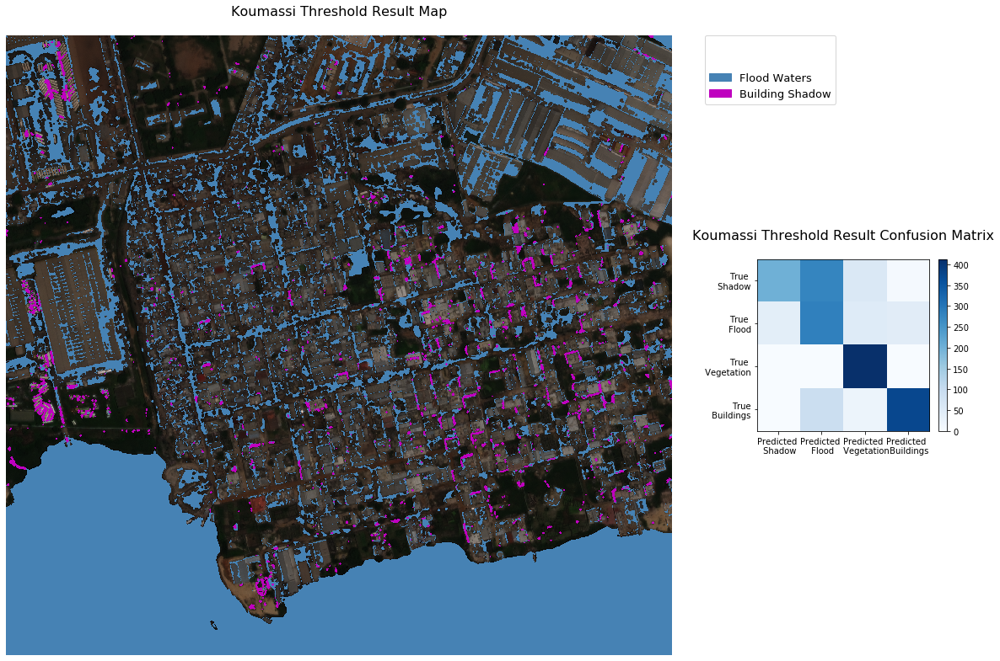

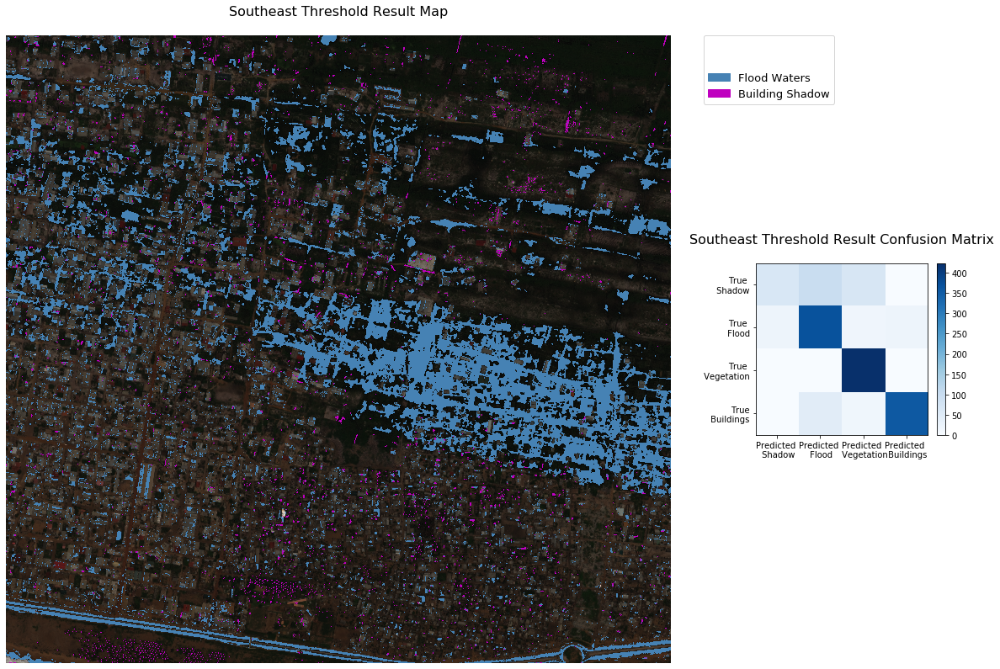

In [25]:
# Import threshold maps and confusion matrices for plotting
koumassi_threshold_path = os.path.join(
    koumassi_threshold_outputs_path, "threshold_map.tif")
koumassi_rgb_path = os.path.join(
    koumassi_threshold_outputs_path, "koumassi_focus_ps_rgb_bands.tif")
with rio.open(koumassi_threshold_path) as src:
    koumassi_threshold_map = src.read()
koumassi_threshold_map = np.squeeze(koumassi_threshold_map)
with rio.open(koumassi_rgb_path) as src:
    koumassi_rgb_map = src.read()

southeast_threshold_path = os.path.join(
    southeast_threshold_outputs_path, "threshold_map.tif")
southeast_rgb_path = os.path.join(
    southeast_threshold_outputs_path, "southeast_ps_rgb_bands.tif")
with rio.open(southeast_threshold_path) as src:
    southeast_threshold_map = src.read()
southeast_threshold_map = np.squeeze(southeast_threshold_map)
with rio.open(southeast_rgb_path) as src:
    southeast_rgb_map = src.read()

koumassi_confusion_threshold = pd.read_csv(koumassi_threshold_outputs_path+'threshold_confusion.csv')
koumassi_confusion_threshold = koumassi_confusion_threshold.drop(koumassi_confusion_threshold.columns[[0]], axis=1)
koumassi_confusion_threshold_plot = koumassi_confusion_threshold.values
koumassi_confusion_threshold_plot=koumassi_confusion_threshold_plot[0:4,0:4]

southeast_confusion_threshold = pd.read_csv(southeast_threshold_outputs_path+'threshold_confusion.csv')
southeast_confusion_threshold = southeast_confusion_threshold.drop(southeast_confusion_threshold.columns[[0]], axis=1)
southeast_confusion_threshold_plot = southeast_confusion_threshold.values
southeast_confusion_threshold_plot=southeast_confusion_threshold_plot[0:4,0:4]

# fig,ax = plt.subplots(figsize=(20,10))
# ep.plot_rgb(rgb_bands,rgb=(2, 1, 0), ax=ax)
# cmap = ListedColormap(['none','none','none','steelblue','m'])
# ax.imshow(index_comb, cmap = cmap)
# ax.set_axis_off()
# plt.show()

# Plot threshold maps and confusion matres
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
ep.plot_rgb(koumassi_rgb_map,rgb=(2, 1, 0), ax=ax1)
cmap = ListedColormap(['none','none','none','steelblue','m'])
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
labels = ['','','Flood Waters', 'Building Shadow']
im = ax1.imshow(koumassi_threshold_map, cmap=cmap)
conf_mat = ax2.imshow(koumassi_confusion_threshold_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="Koumassi Threshold Map\n")
ax2.set(title="Koumassi Threshold Confusion Matrix\n")
# class_bins = [2,3,4] 
# array_classified = np.digitize(koumassi_threshold_map, class_bins)
# classes = np.unique(array_classified)
# classes = classes.tolist()
# classes=[0,1,2,3]
# ep.draw_legend(im,
#                classes=classes,
#                titles=labels)
divider = make_axes_locatable(ax2)
ep.draw_legend(im, titles=labels, classes=[0,1,2,3])
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()


# Plot threshold maps and confusion matres
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
ep.plot_rgb(southeast_rgb_map,rgb=(2, 1, 0), ax=ax1)
cmap = ListedColormap(['none','none','none','steelblue','m'])
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
labels = ['','','Flood Waters', 'Building Shadow']
im = ax1.imshow(southeast_threshold_map, cmap=cmap)
conf_mat = ax2.imshow(southeast_confusion_threshold_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="Southeast Threshold Map\n")
ax2.set(title="Southeast Threshold Confusion Matrix\n")
ep.draw_legend(im, titles=labels, classes=[0,1,2,3])
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

**Figure 4.** For each of the two study areas: Koumassi and Southeast, the threshold result map shows the extent of flooding, along with areas of building shadow, vegetation and buildings. The confusion matrix for the Koumassi site shows frequent confusion between true shadow and predicted flood. The confusion matrix for the Southeast site also shows miscategorization between shadows and flood, though less frequently. 

## Supervised Machine Learning

Supervised machine learning approaches were examined next, and the results from utilzing the Support Vector Machine classifier are included in this blog. Inputs to the models were selected after exploring various combinations of raw spectral bands and index values. Supervised machine learning methods require a training data set, with known values for the classes of interest to define the model. In this case, developing a training data set required a detailed examination of the satellite image, with training points dropped on specific locations to identify building shadow and flood. Selecting model inputs and developing training data can be time intensive and is a reminder that despite the power of machine learning methods, human inputs are imperative! The accuracy score for the final SVM model was 96% for the internal testing dataset, and 92% for the random forest model.


Once the models were trained and refined, they were validated on an external data set. Accuracy scores for the external validation were 93% and 92% for Support Vector Machine and Random Forest, respectively. Results for the supervised methods are promising and present a substantial improvement over the thresholding approach.

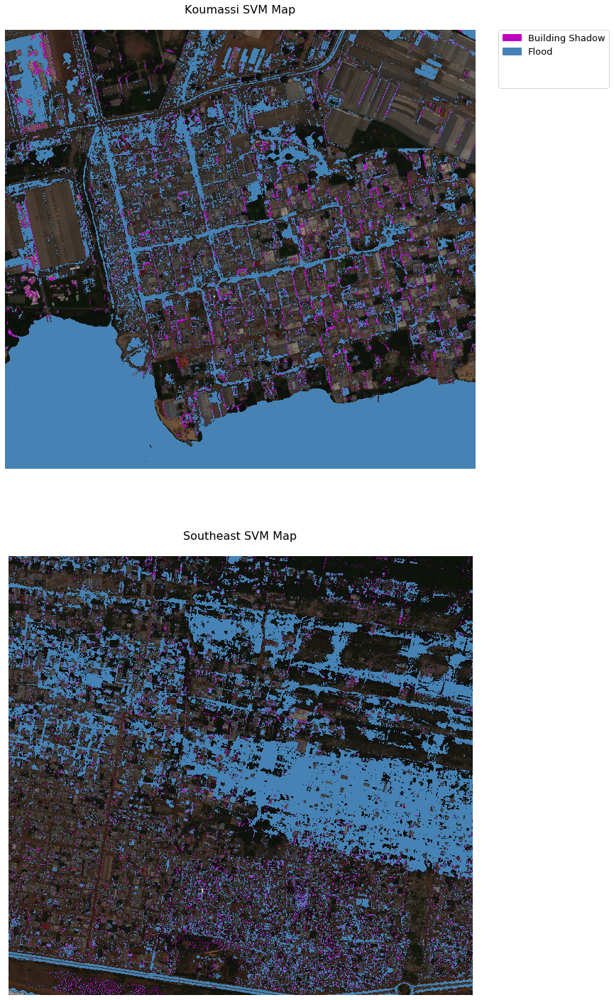

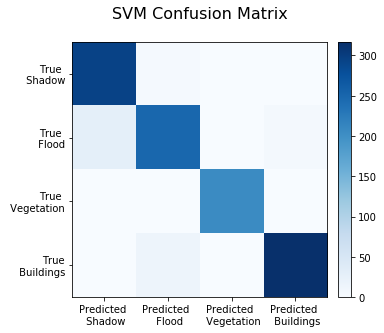

In [65]:
# Import SVM map and confusion matrix for plotting
koumassi_svm_path = os.path.join(
    combined_path, "koumassi_SVM_map_combined_final.tif")
with rio.open(koumassi_svm_path) as src:
    koumassi_svm_map = src.read()
koumassi_svm_map = np.squeeze(koumassi_svm_map)

southeast_svm_path = os.path.join(
    combined_path, "southeast_SVM_map_combined_final.tif")
with rio.open(southeast_svm_path) as src:
    southeast_svm_map = src.read()
southeast_svm_map = np.squeeze(southeast_svm_map)

confusion_svm = pd.read_csv(combined_path+'confusion_svm_external_424.csv')
confusion_svm = confusion_svm.drop(confusion_svm.columns[[0]], axis=1)
confusion_svm_plot = confusion_svm.values


# Plot SVM maps for Koumassi and Southeast
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(
    30, 25))
ep.plot_rgb(koumassi_rgb_map,rgb=(2, 1, 0), ax=ax1)
ep.plot_rgb(southeast_rgb_map,rgb=(2, 1, 0), ax=ax2)
cmap = ListedColormap(['m', 'steelblue', 'none','none'])
labels = ['Building Shadow', 'Flood','','']
im = ax1.imshow(koumassi_svm_map, cmap=cmap)
im2 = ax2.imshow(southeast_svm_map, cmap=cmap)
ax1.set(title="Koumassi SVM Map\n")
ax2.set(title="Southeast SVM Map\n")
ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
ax2.set_axis_off()
plt.show()

# # Plot confusion matrix for overall SVM model
fig, ax = plt.subplots(figsize=(5, 5))
plt.setp(ax, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax.imshow(confusion_svm_plot, cmap='Blues',
                      interpolation='nearest')
ax.set(title="SVM Confusion Matrix\n")
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
plt.show()

**Figure 5.** The SVM result map shows the modeled extent of flooding within the study area, along with areas of building shadow, and other classes (vegetation and buildings). The confusion matrix shows that shadow is accurately predicted, while there is some miscategorization of flood water as shadow.  

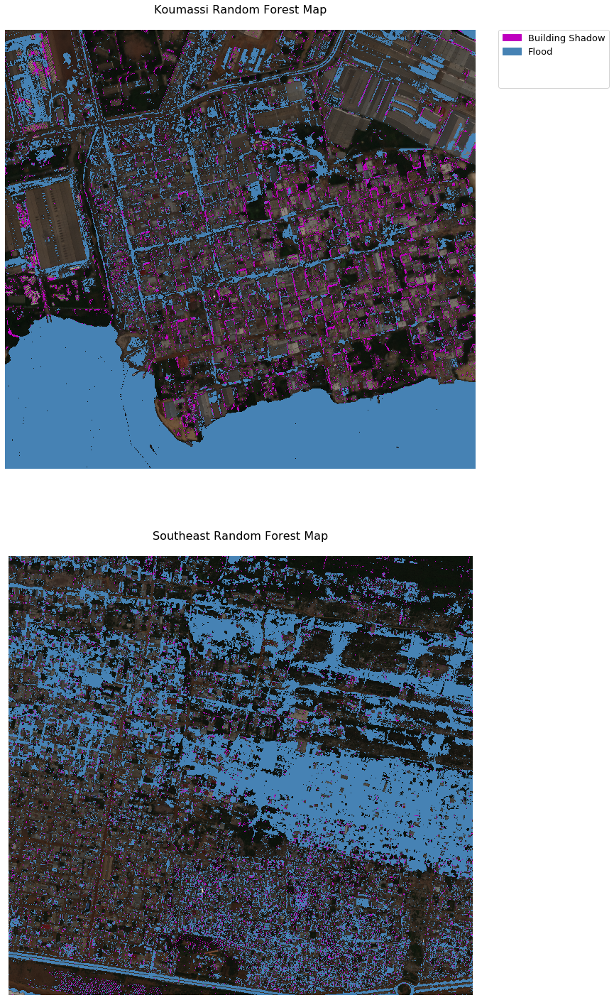

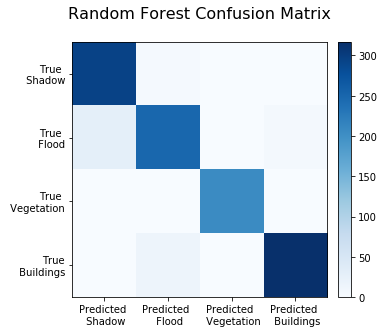

In [66]:
# Import RF map and confusion matrix for plotting
koumassi_rf_path = os.path.join(
    combined_path, "koumassi_RF_map_combined_424.tif")
with rio.open(koumassi_rf_path) as src:
    koumassi_rf_map = src.read()
koumassi_rf_map = np.squeeze(koumassi_rf_map)

southeast_rf_path = os.path.join(
    combined_path, "southeast_RF_map_combined_424.tif")
with rio.open(southeast_rf_path) as src:
    southeast_rf_map = src.read()
southeast_rf_map = np.squeeze(southeast_rf_map)

confusion_rf = pd.read_csv(combined_path+'confusion_rf_external_424.csv')
confusion_rf = confusion_rf.drop(confusion_rf.columns[[0]], axis=1)
confusion_rf_plot = confusion_rf.values


# Plot SVM maps 
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(
    30, 25))
ep.plot_rgb(koumassi_rgb_map,rgb=(2, 1, 0), ax=ax1)
ep.plot_rgb(southeast_rgb_map,rgb=(2, 1, 0), ax=ax2)
cmap = ListedColormap(['m', 'steelblue', 'none','none'])
labels = ['Building Shadow', 'Flood', '', '']
im = ax1.imshow(koumassi_rf_map, cmap=cmap)
im2 = ax2.imshow(southeast_rf_map, cmap=cmap)
ax1.set(title="Koumassi Random Forest Map\n")
ax2.set(title="Southeast Random Forest Map\n")
ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
ax2.set_axis_off()
plt.show()

# # Plot confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
plt.setp(ax, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax.imshow(confusion_svm_plot, cmap='Blues',
                      interpolation='nearest')
ax.set(title="Random Forest Confusion Matrix\n")
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
plt.show()

**Figure 6.** The random forest result map shows the extent of flooding within the study area, along with areas of building shadow, and other classes (vegetation and buildings). The confusion matrix shows that shadow is accurately predicted, while there is some miscategorization of flood waters.  

## Unsupervised Machine Learning
Finally, unsupervised machine learning approaches includes k-means and the Gaussian Mixture Model were explored. The Gaussian Mixture Model did not fit the data well and results are presented in Figure YY for cmpleteness, but are not discussed in this summary. Unsupervised methods do not require any training data sets, and instead find similarities within the inputs, and automatically output clusters. The input for these two methods was the eight-band raster stack. K-means results are presented in Figure 3 had an accuracy score of 84% and 78% for Koumassi and Southeast, respectively. 

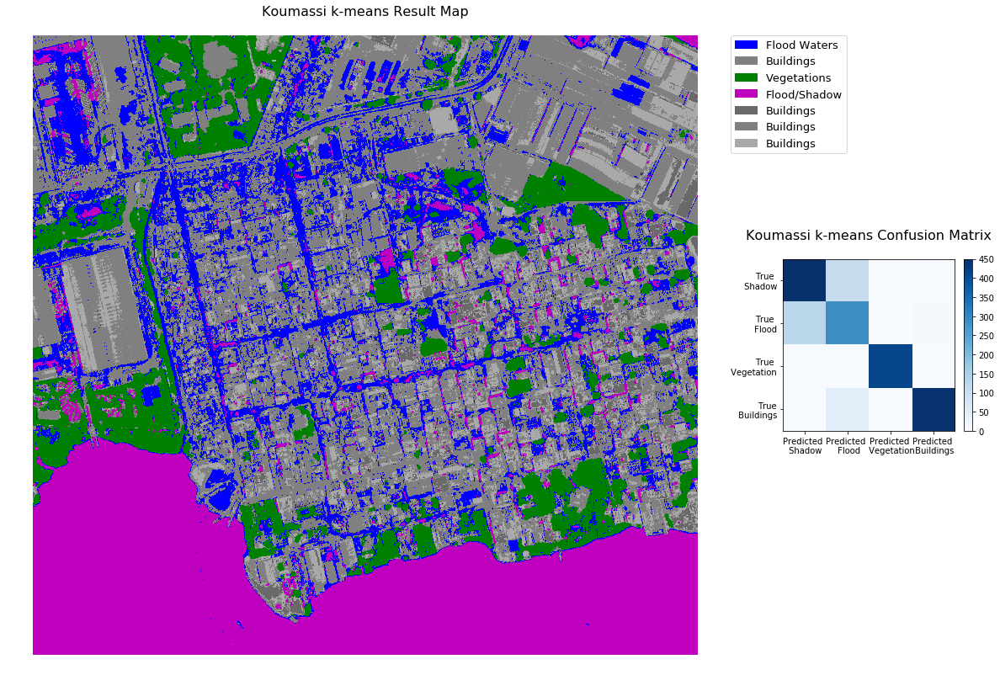

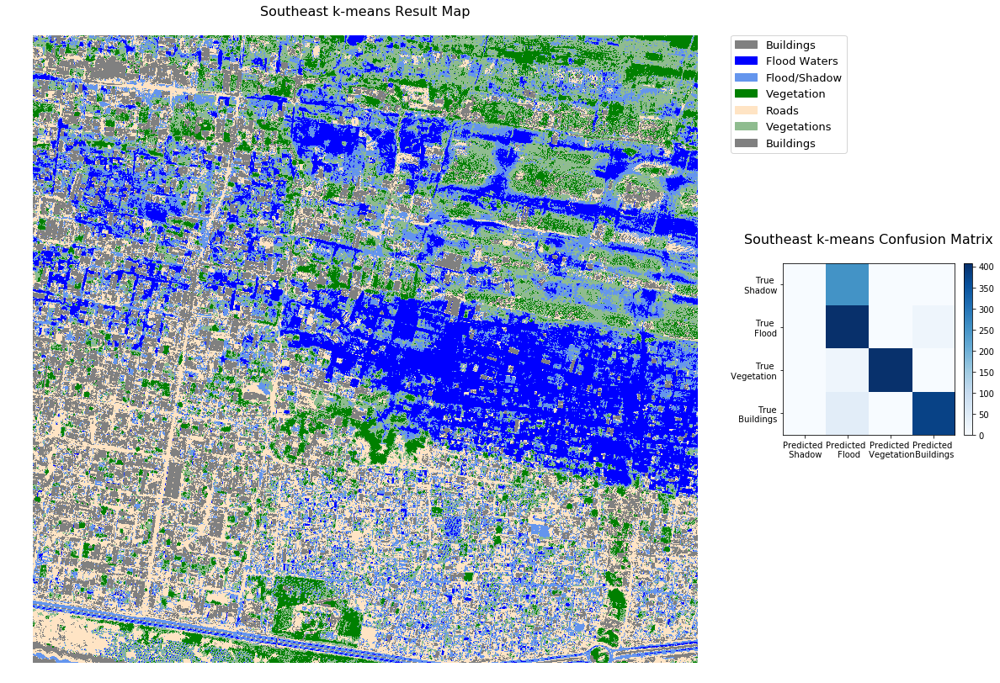

In [49]:
# Plot koumassi kmeans results
koumassi_kmeans_path = os.path.join(
    koumassi_kmeans_outputs_path, "kmeans_all_bands.tif")
with rio.open(koumassi_kmeans_path) as src:
    koumassi_kmeans_map = src.read()
koumassi_kmeans_map = np.squeeze(koumassi_kmeans_map)

southeast_kmeans_path = os.path.join(
    southeast_kmeans_outputs_path, "kmeans_all_bands.tif")
with rio.open(southeast_kmeans_path) as src:
    southeast_kmeans_map = src.read()
southeast_kmeans_map = np.squeeze(southeast_kmeans_map)


koumassi_confusion_kmeans = pd.read_csv(koumassi_kmeans_outputs_path+'kmeans_all_bands_confusion_all.csv')
koumassi_confusion_kmeans = koumassi_confusion_kmeans.drop(koumassi_confusion_kmeans.columns[[0]], axis=1)
koumassi_confusion_kmeans_plot = koumassi_confusion_kmeans.values

southeast_confusion_kmeans = pd.read_csv(southeast_kmeans_outputs_path+'kmeans_all_bands_confusion_all_no_shadow.csv')
southeast_confusion_kmeans = southeast_confusion_kmeans.drop(southeast_confusion_kmeans.columns[[0]], axis=1)
southeast_confusion_kmeans_plot = southeast_confusion_kmeans.values


# Plot koumassi kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
cmap = ListedColormap(['blue','grey','green','m','dimgrey','grey','darkgrey'])
# cmap = ListedColormap(['steelblue','none','none','blue','none','none','none'])
labels = ['Flood Waters','Buildings','Vegetations','Flood/Shadow', 'Buildings','Buildings','Buildings']
im = ax1.imshow(koumassi_kmeans_map, cmap=cmap)
shadow_cmap = ListedColormap(['none','none','none','none','m'])
ep.draw_legend(im, titles=labels,classes=[1,2,3,4,5,6,7])
ax1.imshow(koumassi_threshold_map, cmap=shadow_cmap)
ax1.set(title="Koumassi k-means Map\n")
ax1.set_axis_off()

# Plot confusion matrix
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax2.imshow(koumassi_confusion_kmeans_plot,
                      cmap='Blues', interpolation='nearest')
ax2.set(title="Koumassi k-means Confusion Matrix\n")
# ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

# Plot southeast kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
cmap = ListedColormap(['none','blue','cornflowerblue','none','none','none','none'])
cmap = ListedColormap(['grey','blue','cornflowerblue','green','bisque','darkseagreen','grey'])
labels = ['Buildings','Flood Waters','Flood/Shadow','Vegetation','Roads','Vegetations','Buildings']
im = ax1.imshow(southeast_kmeans_map, cmap=cmap)

# Plot confusion matrix
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax2.imshow(southeast_confusion_kmeans_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="Southeast k-means Map\n")
ax2.set(title="Southeast k-means Confusion Matrix\n")
ep.draw_legend(im, titles=labels,classes=[1,2,3,4,5,6,7])
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

**Figure 7.** The k-means results show substantial confusion between shadow and flood for both Koumassi and Southeast. For Koumassi, the shadow/flood cluster is visualized as a shadow cluster (pink) while  for the Southeast it is visualized as a flood cluster (blue) based on overall accuracy scores. 

For Koumassi, the k-means output shows substantial confusion between shadow and flood waters, especially in the "shadow" cluster as seen in Figure 4, with a close-up view presented in Figure 5. The overall accuracy score was higher when the shado/flood cluster was defined as a shadow cluster (84%) compared to when the cluster was defined as flood (67%). This finding is likely related to the fact that there are a substantial number of shadow reference points in the Koumassi AOI. Conversely, for Southeast, the k-means output showed a higher overall accuracy score when the flood/shadow cluster was defined as flood (78%) compared to when the cluster was defined as shadow (67%). 

While the k-means accuracy scores are not as high as the supervised machine learning models, k-means does not require a training data set to develop, meaning that substantially less effort is required to use these unsupervised approaches! 

<img src="Shadow_Confusion.png"> 

**Figure 5.** The bright pink cluster includes both shadow and flood waters. The blue cluster is flood water, grey clusters are biuldings and the green cluster is vegetation. 

An exploration into the characteristics of the flood water and building shadow clusters was done using the regionsprops method from scikit-image. Flood and shadow clusters were first converted into contiuous objects or regions using the scikit-image labeling method. Minimum, maximum and average values were calculated for a range of region/object properties including area, perimeter,major and minor axis length and extent. Unique ranges were identified for flood vs. building shadow, and clusters were reassigned based on the ranges. However, the accuracy score improvement was minor (1-2%) for such a time intensive process. This approach still seems potentially interesting, but would require additional time for a full investigation.    

Finally, improved visualizations and flood-only accuracy scores were developed by reassigning the "shadow" cluster as a second flood cluster and applying the thresholded shadow mask to the image. Flood only accuracy scores increased from 68% to 98% and 86% to 93% for Koumassi and Southeast, respectively. While not a perfect flood mapping tool on its own, applying the k-means method may provide additional information in the flood map preparation process.

# Trying to create legend with flood water and shadow mask

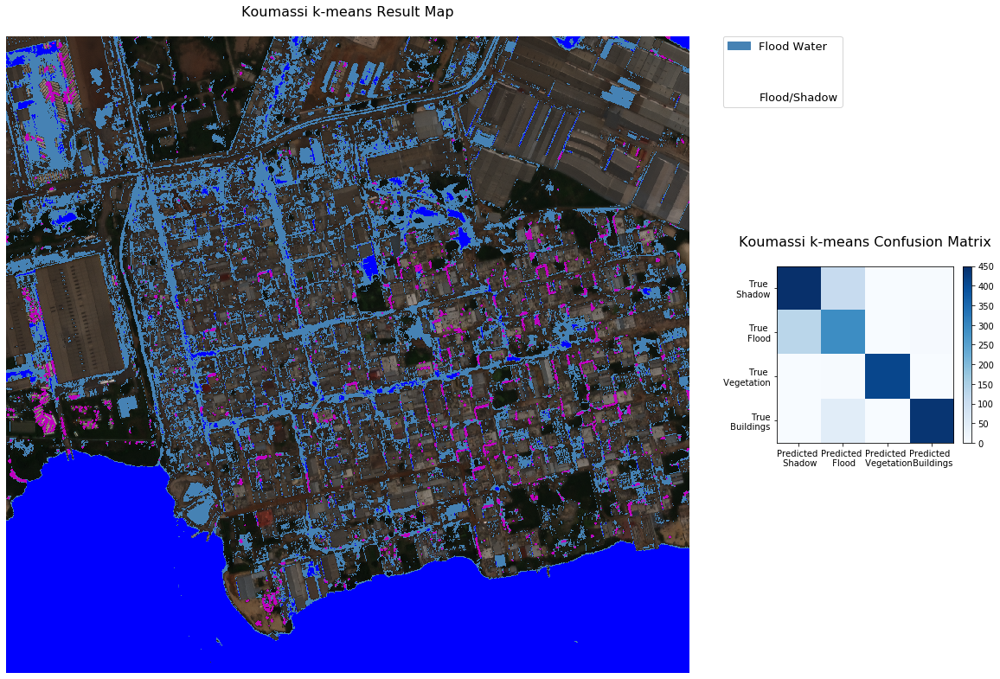

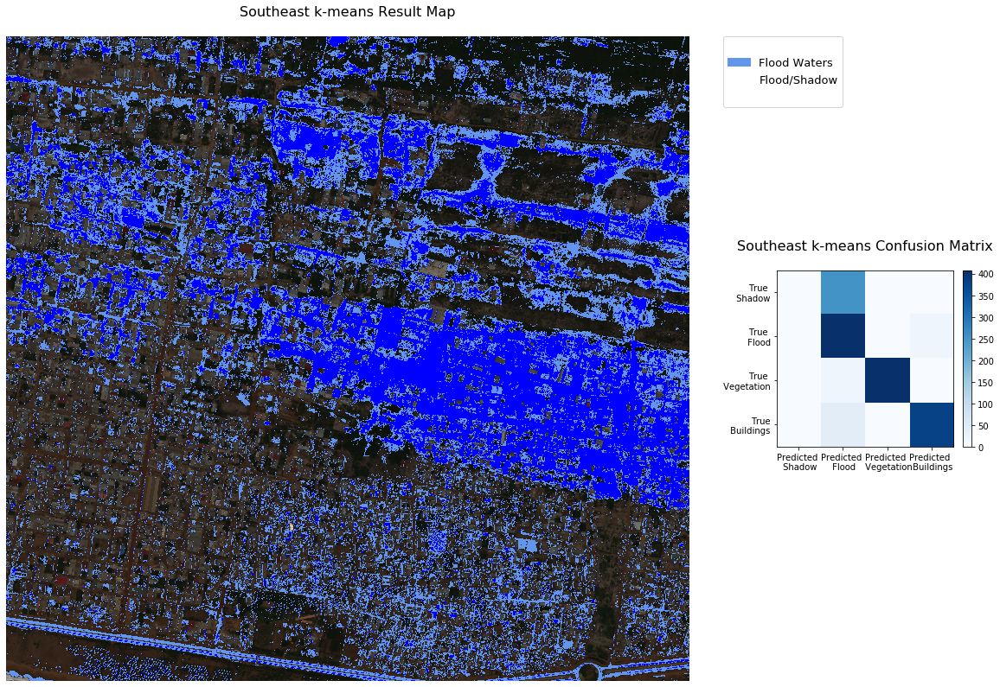

In [71]:
# # Plot koumassi kmeans results
# koumassi_kmeans_path = os.path.join(
#     koumassi_kmeans_outputs_path, "kmeans_all_bands.tif")
# with rio.open(koumassi_kmeans_path) as src:
#     koumassi_kmeans_map = src.read()
# koumassi_kmeans_map = np.squeeze(koumassi_kmeans_map)

# southeast_kmeans_path = os.path.join(
#     southeast_kmeans_outputs_path, "kmeans_all_bands.tif")
# with rio.open(southeast_kmeans_path) as src:
#     southeast_kmeans_map = src.read()
# southeast_kmeans_map = np.squeeze(southeast_kmeans_map)


# koumassi_confusion_kmeans = pd.read_csv(koumassi_kmeans_outputs_path+'kmeans_all_bands_confusion_all.csv')
# koumassi_confusion_kmeans = koumassi_confusion_kmeans.drop(koumassi_confusion_kmeans.columns[[0]], axis=1)
# koumassi_confusion_kmeans_plot = koumassi_confusion_kmeans.values

# southeast_confusion_kmeans = pd.read_csv(southeast_kmeans_outputs_path+'kmeans_all_bands_confusion_all.csv')
# southeast_confusion_kmeans = southeast_confusion_kmeans.drop(southeast_confusion_kmeans.columns[[0]], axis=1)
# southeast_confusion_kmeans_plot = southeast_confusion_kmeans.values


# Plot koumassi kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
ep.plot_rgb(koumassi_rgb_map,rgb=(2, 1, 0), ax=ax1)
# cmap = ListedColormap(['blue','grey','green','cornflowerblue','dimgrey','grey','darkgrey'])
cmap = ListedColormap(['steelblue','none','none','blue','none','none','none'])
labels = ['Flood Water','','','Flood/Shadow']
im = ax1.imshow(koumassi_kmeans_map, cmap=cmap)
shadow_cmap = ListedColormap(['none','none','none','none','m'])
ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
ax1.imshow(koumassi_threshold_map, cmap=shadow_cmap)
ax1.set(title="Koumassi k-means Result Map\n")
ax1.set_axis_off()

# Plot confusion matrix
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax2.imshow(koumassi_confusion_kmeans_plot,
                      cmap='Blues', interpolation='nearest')
ax2.set(title="Koumassi k-means Confusion Matrix\n")
ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

# Plot southeast kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
ep.plot_rgb(southeast_rgb_map,rgb=(2, 1, 0), ax=ax1)
cmap = ListedColormap(['none','blue','cornflowerblue','none','none','none','none'])
# cmap = ListedColormap(['grey','blue','cornflowerblue','green','bisque','darkseagreen','grey'])
labels = ['','Flood Waters','Flood/Shadow','']
im = ax1.imshow(southeast_kmeans_map, cmap=cmap)

# Plot confusion matrix
plt.setp(ax2, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
conf_mat = ax2.imshow(southeast_confusion_kmeans_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="Southeast k-means Result Map\n")
ax2.set(title="Southeast k-means Confusion Matrix\n")
ep.draw_legend(im, titles=labels,classes=[1,2,3,4])
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

**Figure 8.** 

In [57]:
# Plot koumassi kmeans results
koumassi_gmm_path = os.path.join(
    koumassi_kmeans_explorations_path, "gmm_all_bands.tif")
with rio.open(koumassi_kmeans_path) as src:
    koumassi_gmm_map = src.read()
koumassi_gmm_map = np.squeeze(koumassi_gmm_map)

southeast_gmm_path = os.path.join(
    southeast_kmeans_explorations_path, "gmm_all_bands.tif")
with rio.open(southeast_gmm_path) as src:
    southeast_gmm_map = src.read()
southeast_gmm_map = np.squeeze(southeast_gmm_map)


koumassi_confusion_gmm = pd.read_csv(koumassi_kmeans_explorations_path+'gmm_all_bands_confusion_all.csv')
koumassi_confusion_gmm = koumassi_confusion_gmm.drop(koumassi_confusion_gmm.columns[[0]], axis=1)
koumassi_confusion_gmm_plot = koumassi_confusion_gmm.values

southeast_confusion_gmm = pd.read_csv(southeast_kmeans_explorations_path+'gmm_all_bands_confusion_all.csv')
southeast_confusion_gmm = southeast_confusion_gmm.drop(southeast_confusion_gmm.columns[[0]], axis=1)
southeast_confusion_gmm_plot = southeast_confusion_gmm.values


# Plot koumassi kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
ep.plot_rgb(koumassi_rgb_map,rgb=(2, 1, 0), ax=ax1)
# ep.plot_rgb(southeast_rgb_map,rgb=(2, 1, 0), ax=ax2)
# cmap = ListedColormap(['blue','grey','green','cornflowerblue','dimgrey','grey','darkgrey'])
cmap = ListedColormap(['steelblue','none','none','blue','none','none','none'])
plt.setp(ax, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
labels = ['Flood','Building','Vegetation','Shadow','Building','Building','Building']
im = ax1.imshow(koumassi_gmm_map, cmap=cmap)
shadow_cmap = ListedColormap(['none','none','none','none','m'])
ax1.imshow(koumassi_threshold_map, cmap=shadow_cmap)
conf_mat = ax2.imshow(koumassi_confusion_gmm_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="GMM Result Map\n")
ax2.set(title="GMM Result Confusion Matrix\n")
ep.draw_legend(im, titles=labels)
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

# Plot southeast kmeans map and confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(
    20, 15), gridspec_kw={'width_ratios': [3.5, 1]})
cmap = ListedColormap(['grey','blue','cornflowerblue','green','bisque','darkseagreen','grey'])
plt.setp(ax, xticks=np.arange(4), xticklabels=['Predicted \n Shadow', 'Predicted \n Flood', 'Predicted \n Vegetation','Predicted \n Buildings'],
         yticks=np.arange(4), yticklabels=['True \n Shadow', 'True \n Flood', 'True \n Vegetation','True\n Buildings'])
labels = ['Building','Flood','Shadow','Vegetation_1','Building/Roads','Vegetation_2','Building']
im = ax1.imshow(southeast_gmm_map, cmap=cmap)
conf_mat = ax2.imshow(southeast_confusion_gmm_plot,
                      cmap='Blues', interpolation='nearest')
ax1.set(title="GMM Result Map\n")
ax2.set(title="GMM Result Confusion Matrix\n")
ep.draw_legend(im, titles=labels)
divider = make_axes_locatable(ax2)
cax1 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(conf_mat, cax=cax1)
ax1.set_axis_off()
plt.show()

RasterioIOError: ..\data\southeast_ps\explorations_outputs\kmeans\gmm_all_bands.tif: No such file or directory

**Figure 9.** The GMM result map show the modeled extent of flooding within the study area, along with areas of building shadow, and other classes (vegetation and buildings). The GMM model resulted in clusters, with all clusters other than those capturing building shadow and flood classified as "other". The magenta cluster shows that both shadow and flood are captured within the same cluster. The confusion matrix also shows miscategorization for both shadow and flood. Input to the k-means model was the 8-band stack which had been cloud masked, plus a shadow mask layer. 

# Conclusions and Next Steps

The machine learning methods explored in this study appear to offer additional and more accurate information beyond the traditional thresholding result, with a similar (or lesser!) level of effort. Improvements to the flood plain mapping process means that decision makers can have the best information possible when planning developments, zoning areas of the city, and offering insurance to residents. Better information means that more people can be better prepared and protected from the potential damage from floods.

Additionally, the machine learning models were each developed on two small subsections of the city. By spending time developing a training data set on representative portions of a city, a good approximation of flooding extent for a much larger area appears possible. The SVM model was applied to the entire Koumassi image, with result shown in Figure XX. 

In [67]:
# Plot result of RF being applied to entire city
svm_extended_path = os.path.join(
    combined_path, "final_SVM_abidjan.tif")
with rio.open(svm_extended_path) as src:
    svm_map_extended = src.read()
svm_map_extended = np.squeeze(svm_map_extended)

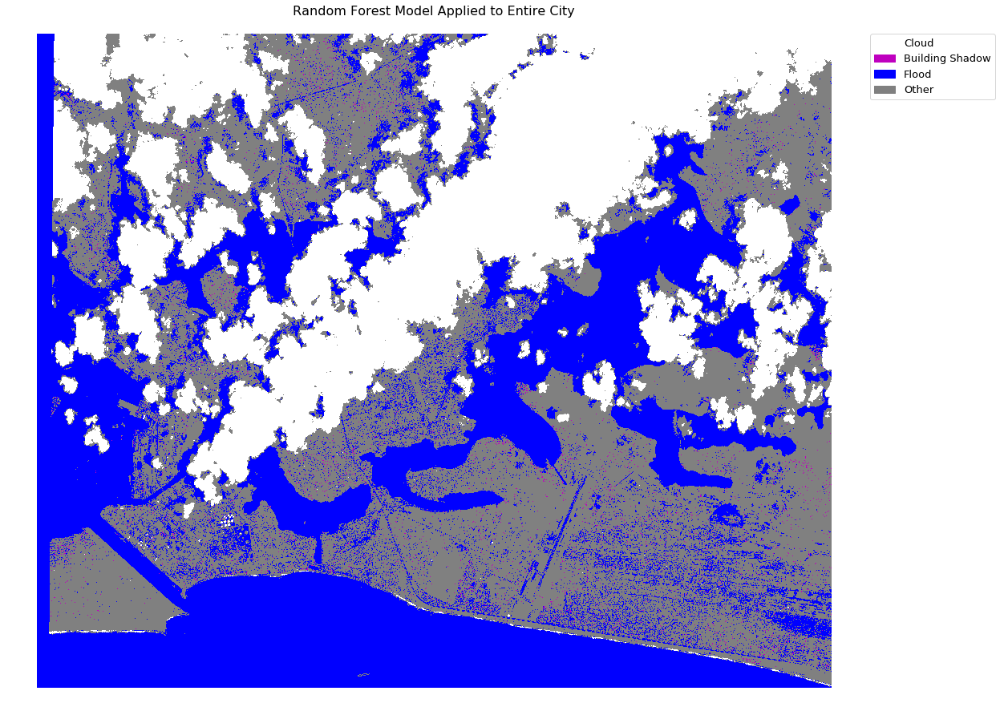

In [69]:
# Plot random forest map for entire city
fig, ax = plt.subplots(figsize=(20, 15))
cmap = ListedColormap(['white','m', 'blue', 'grey'])
labels = ['Cloud','Building Shadow', 'Flood', 'Other']
im_ext = ax.imshow(svm_map_extended, cmap=cmap)
ax.set(title="Random Forest Model Applied to Entire City\n")
ep.draw_legend(im_ext, titles=labels, classes=[1,2,3,4])
ax.set_axis_off()
plt.show()

**Figure 10.** The support vectorm machine (SVM) model shows flooding throughout the city, especially in the southeastern section of the city. This map has not been validated, but offers an interesting glimpse into the potential for developing a detailed supervised model on a representative subsection of a larger image, and then applying it to the greater image.

# Future Work
Future work includes incorporating a building layer from a source such as Open Street Map, expanding the urban model which includes both buildings and surrounding low-lying wetlands and agricultural terrain and testing the validated models to see how applicable they are for other flooded urban areas. 

For more details, check out my [Flood Detection GitHub repository](http://www.github.com/katysill/flood-detection)

### References


- Cloud to Street. Urban Flood Mapping Using Very-High Resolution Satellite Imagery. Available at: https://abidjan.cloudtostreet.info/info

- Huang, X., Xie, C., Fang, X., Zhang, L. (2015) Combining Pixel-and Object-Based Machine Learning for Identification of Water-Body Types from Urban High-Resolution Remote-Sensing Imagery. IEEE J. Sel. Top. Appl. Earth Obs. Remote Sens. 8, 2097–2110.

- Huang, X., and Zhang, L. (2012) Morphological Building/Shadow Index for Building Extraction From High-Resolution Imagery Over Urban Areas. IEEE J. Sel. Top. Appl. Earth Obs. Remote Sens. 5, 161-172.

- McFeeters, S.K. (1996) The use of the Normalized Difference Water Index (NDWI) in the delineation of open water features, International Journal of Remote Sensing, 17:7, 1425-1432, DOI: 10.1080/01431169608948714

- United Nations Office for Disaster Risk Reduction (UNISDR) and Centre for Research on the Epidemiology of Disasters (CRED) (2018). Economic losses, poverty & disasters: 1998-2017. Available at: https://www.preventionweb.net/files/61119_credeconomiclosses.pdf

- Xie, C., Huang, X., Zeng, W., & Fang, X. (2016). A novel water index for urban high-resolution eight-band WorldView-2 imagery. International Journal of Digital Earth, 9(10), 925–941.

- Xu, H. (2006). Modification of normalised difference water index (NDWI) to enhance open water features in remotely sensed imagery. International Journal of Remote Sensing. Vol. 27, No. 14, 3025–3033.